In [1]:
import xarray as xr
import gcsfs
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import time
from matplotlib.colors import LogNorm
from IPython.display import clear_output
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from intake import open_catalog

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import plot_model

import pandas as pd



In [43]:
from timeit import default_timer as timer

In [2]:
plt.rcParams.update({'font.size': 14
    , 'legend.markerscale': 1., 'axes.titlesize': 14, 'axes.labelsize' : 12,
      'legend.fontsize' : 13,'legend.handlelength': 3})

plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)

color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# plt.rcParams['figure.figsize'] = (14.,5.)



blue = cm.get_cmap('Blues', 256)
green = cm.get_cmap('Greens', 256)
red = cm.get_cmap('Reds', 256)
grey = cm.get_cmap('Greys', 256)
bone = cm.get_cmap('bone_r', 256)
binary = cm.get_cmap('binary', 256)
hot = cm.get_cmap('hot_r', 256)
gray = cm.get_cmap('gray_r', 256)


newcolors5 = blue(np.linspace(0, 1, 256))**2*grey(np.linspace(0, 1, 256))**0.2
newcmp5 = ListedColormap(newcolors5[::-1], name='BlueGrey')

newcolors7 = blue(np.linspace(0, 1, 256))**1.5*green(np.linspace(0, 1, 256))**0.3*grey(np.linspace(0, 1, 256))**0.03
newcmp7 = ListedColormap(newcolors7[::-1], name='BluegreenGrey')

newcmp6 = ListedColormap(newcolors5, name='BlueGrey_r')
newcmp8 = ListedColormap(newcolors7, name='BlueGreenGrey_r')

def plot_examples(cms):
    """
    helper function to plot two colormaps
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)

    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    for [ax, cmap] in zip(axs, cms):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()

In [3]:
cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/CESM_POP.yaml")
ds  = cat["CESM_POP_hires_control"].to_dask()
# ds

In [4]:
ds = ds.rename({'U1_1':'U', 'V1_1':'V', 'TAUX_2':'TAUX', 'TAUY_2':'TAUY', 'SSH_2':'SSH', 'ULONG':'XU', 'ULAT':'YU'})

def make_3d_coords(lon,lat):
    X = np.sin(np.radians(lat))
    Y = np.sin(np.radians(lon))*np.cos(np.radians(lat))
    Z = -np.cos(np.radians(lon))*np.cos(np.radians(lat))
    return (X,Y,Z)

X, Y, Z = make_3d_coords(ds.XU.data, ds.YU.data)

ds['X'] = ds.XU.dims, X
ds['Y'] = ds.XU.dims, Y
ds['Z'] = ds.XU.dims, Z

def normalize_gridspacing(DX,DY):
    dX = (DX - np.mean(DX))/np.std(DX)
    dY = (DY - np.mean(DY))/np.std(DY)
    
    return (dX, dY)

dX, dY = normalize_gridspacing(ds.DXT.data, ds.DYT.data)

ds['dx'] = ds.XU.dims, dX
ds['dy'] = ds.XU.dims, dY

ds

<xarray.Dataset>
Dimensions:             (nlat: 2400, nlon: 3600, time: 14965, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
    ANGLE               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    ANGLET              (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DXT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DXU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DYT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    DYU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HT                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HTE                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HTN                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HUS                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    HUW                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    KMT                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    KMU                 (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    REGION_MASK         (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    T0_Kelvin           float64 ...
    TAREA               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLAT                (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLONG               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    UAREA               (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    YU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    XU                  (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    cp_air              float64 ...
    cp_sw               float64 ...
    days_in_norm_year   timedelta64[ns] ...
    dz                  (z_t) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    dzw                 (z_w) float32 dask.array<chunksize=(62,), meta=np.ndarray>
    fwflux_factor       float64 ...
    grav                float64 ...
    heat_to_PW          float64 ...
    hflux_factor        float64 ...
    latent_heat_fusion  float64 ...
    latent_heat_vapor   float64 ...
    mass_to_Sv          float64 ...
    momentum_factor     float64 ...
    nsurface_t          float64 ...
    nsurface_u          float64 ...
    ocn_ref_salinity    float64 ...
    omega               float64 ...
    ppt_to_salt         float64 ...
    radius              float64 ...
    rho_air             float64 ...
    rho_fw              float64 ...
    rho_sw              float64 ...
    salinity_factor     float64 ...
    salt_to_Svppt       float64 ...
    salt_to_mmday       float64 ...
    salt_to_ppt         float64 ...
    sea_ice_salinity    float64 ...
    sflux_factor        float64 ...
    sound               float64 ...
    stefan_boltzmann    float64 ...
  * time                (time) object 0046-01-02 00:00:00 ... 0087-01-01 00:0...
    vonkar              float64 ...
  * z_t                 (z_t) float32 500.0 1.5e+03 ... 5.625e+05 5.875e+05
  * z_t_150m            (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                 (z_w) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
  * z_w_bot             (z_w_bot) float32 1e+03 2e+03 3e+03 ... 5.75e+05 6e+05
  * z_w_top             (z_w_top) float32 0.0 1e+03 2e+03 ... 5.5e+05 5.75e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    HMXL_2              (time, 

In [5]:
def reshape_stencil(data, ssize):
    assert data.ndim == 2
    ny, nx = data.shape
    data_rs = data.reshape((ny//ssize, ssize,  nx//ssize, ssize))
    # move stencil to end
    data_mv = np.moveaxis(data_rs, 1, 2)
    data_flat = data_mv.reshape((-1, 2, 2))
    return data_flat

def extract_data(ds, vname, stencil_size, indexer):
    data = ds[vname].values
    data_rs = reshape_stencil(data, stencil_size)
    data_idx = data_rs[(slice(None),) + indexer]
    return data_idx

In [6]:


def prepare_data_2D(ds, apply_mask=True, randomize=True, stencil_size = 2,
                 stencil_vars = ['SSH', 'SST', 'X', 'Y', 'Z'], stencil_index = (slice(None), slice(None)),
                 point_vars = ['TAUX', 'TAUY'], point_index = (0, 0), 
                 target_vars = ['U', 'V'], target_index = (0, 0) ):
    
    stencil_data = [extract_data(ds, vname, stencil_size, stencil_index)
                    for vname in stencil_vars]
    point_data = [extract_data(ds, vname, stencil_size, point_index)
                   for vname in point_vars]
    target_data = [extract_data(ds, vname, stencil_size, target_index)
                   for vname in target_vars]

    if apply_mask:
        mask = np.isnan(stencil_data[0]).sum(axis=(1, 2)) == 0
    else:
        mask = slice(None)
    if randomize:
        random_idx = np.random.permutation(mask.sum())
    else:
        random_idx = slice(None)

    features_stencil = np.stack([data[mask][random_idx] for data in stencil_data],
                                axis=-1)
    features_point = np.stack([data[mask][random_idx] for data in point_data],
                               axis=-1)
    targets = np.stack([data[mask][random_idx] for data in target_data],
                        axis=-1)
    
    return [features_stencil, features_point], targets

In [7]:
ds_snap = ds.isel(time=10)

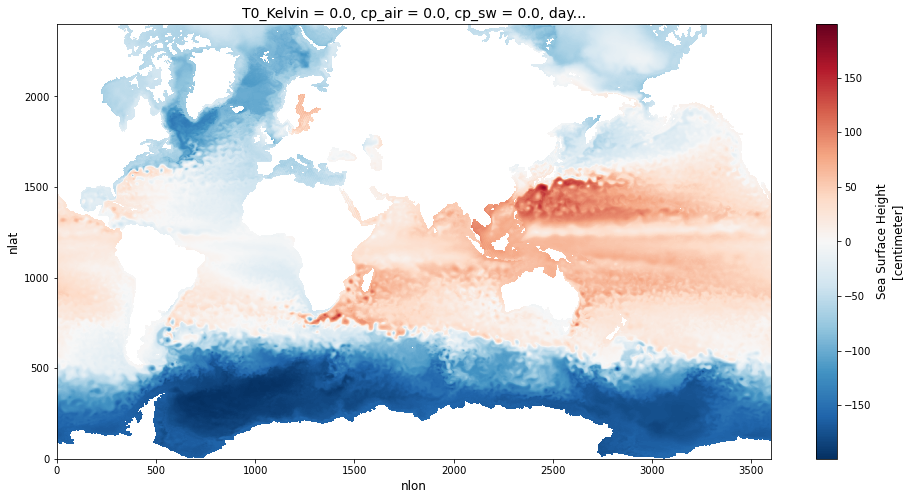

In [8]:
plt.figure(figsize=(16,8))
ds_snap.SSH.plot()

In [9]:
ds_kuro = ds.isel(nlon=slice(2200,3200), nlat=slice(1000,2000))
ds_gs = ds.isel(nlon=slice(200,800), nlat=slice(1400,1800))
ds_acc = ds.isel(nlat=slice(250,850))


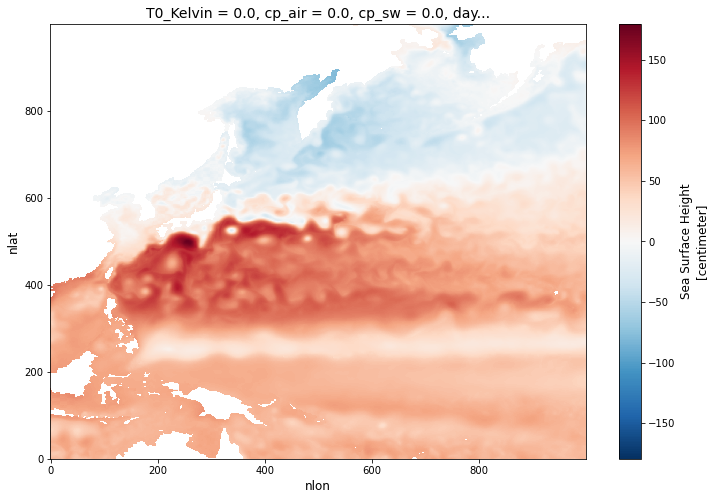

In [10]:
plt.figure(figsize=(12,8))
ds_kuro.isel(time=10).SSH.plot()

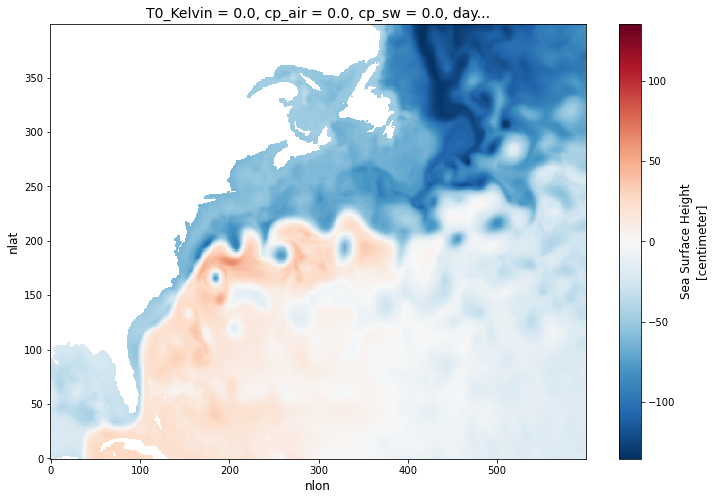

In [11]:
plt.figure(figsize=(12,8))
ds_gs.isel(time=10).SSH.plot()

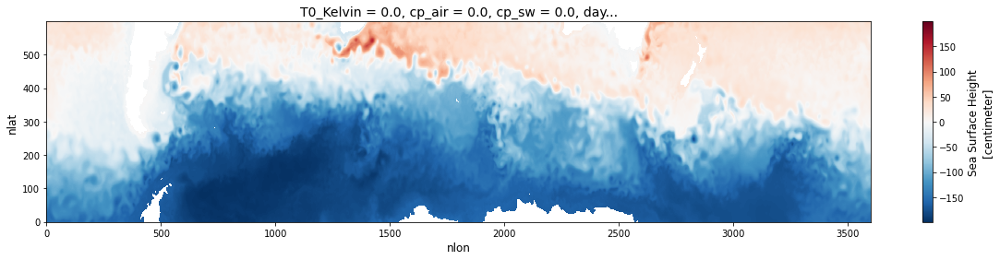

In [12]:
plt.figure(figsize=(20,4))
ds_acc.isel(time=10).SSH.plot()

In [13]:

def prepare_data_linreg(ds, apply_mask=True, randomize=True, stencil_size = 2,
                 stencil_vars = ['SSH', 'SST', 'X', 'Y', 'Z'],stencil_index = (slice(None), slice(None)),
                 point_vars = ['TAUX', 'TAUY'], point_index = (0, 0),
                 target_vars = ['U', 'V'],target_index = (0, 0) ):
    
    stencil_data = np.stack([extract_data(ds, vname, stencil_size, stencil_index)
                    for vname in stencil_vars], axis=-1)
    point_data = np.stack([extract_data(ds, vname, stencil_size, point_index)
                   for vname in point_vars], axis=-1)
    target_data = np.stack([extract_data(ds, vname, stencil_size, target_index)
                   for vname in target_vars], axis=-1)
    features_um = np.append(np.reshape(stencil_data, (stencil_data.shape[0],-1)), point_data, axis=-1)
    if apply_mask:
        mask =  np.isnan(features_um).sum(axis=-1)==0
    else:
        mask = slice(None)
    if randomize:
        random_idx = np.random.permutation(mask.sum())
    else:
        random_idx = slice(None)

    features = features_um[mask][random_idx]
    targets = target_data[mask][random_idx]
    
    return features, targets

In [14]:
inputs = {}
targets = {}

inputs['globe'], targets['globe'] = prepare_data_linreg(ds.isel(time=10), stencil_vars = ['SSH', 'X', 'Y', 'Z'], point_vars=['TAUX','TAUY',])
inputs['acc'], targets['acc'] = prepare_data_linreg(ds_acc.isel(time=10), stencil_vars = ['SSH', 'X', 'Y', 'Z'], point_vars=['TAUX','TAUY',])
inputs['kuro'], targets['kuro'] = prepare_data_linreg(ds_kuro.isel(time=10), stencil_vars = ['SSH', 'X', 'Y', 'Z'], point_vars=['TAUX','TAUY',])
inputs['gs'], targets['gs'] = prepare_data_linreg(ds_gs.isel(time=10), stencil_vars = ['SSH', 'X', 'Y', 'Z'], point_vars=['TAUX','TAUY',])

In [28]:
input_layer = {}
hidden_layer_1 = {}
hidden_layer_2 = {}
hidden_layer_3 = {}
output_layer = {}
model = {}

for r in inputs.keys():
    input_layer[r] = keras.Input(shape=inputs[r].shape[1:])
    hidden_layer_1[r] = tf.keras.layers.Dense(40, activation='relu')(input_layer[r])
    hidden_layer_2[r] = tf.keras.layers.Dense(20, activation='relu')(hidden_layer_1[r])
    hidden_layer_3[r] = tf.keras.layers.Dense(10, activation='relu')(hidden_layer_2[r])
    output_layer[r] = tf.keras.layers.Dense(2)(hidden_layer_3[r])

    model[r] = tf.keras.Model(inputs=input_layer[r],
                        outputs=output_layer[r])

    # optimizer = tf.train.AdamOptimizer()
    model[r].compile(loss='mae', optimizer='Adam', metrics=['mae', 'mse','accuracy'])
    model[r].summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense_20 (Dense)             (None, 40)                760       
_________________________________________________________________
dense_21 (Dense)             (None, 20)                820       
_________________________________________________________________
dense_22 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_23 (Dense)             (None, 2)                 22        
Total params: 1,812
Trainable params: 1,812
Non-trainable params: 0
_________________________________________________________________
Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shap

In [16]:
labels = {}
labels_lr = {}

labels['globe'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_globe'
labels['acc'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_acc'
labels['kuro'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_kuro'
labels['gs'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_gs'

labels_lr['globe'] = 'SSHXYZ_2ps_pointTAUXTAUY_lr_globe'
labels_lr['acc'] = 'SSHXYZ_2ps_pointTAUXTAUY_lr_acc'
labels_lr['kuro'] = 'SSHXYZ_2ps_pointTAUXTAUY_lr_kuro'
labels_lr['gs'] = 'SSHXYZ_2ps_pointTAUXTAUY_lr_gs'



In [17]:
# model = keras.Sequential([
#       layers.Dense(1, use_bias=True, input_shape=(1,))
#     ])
# optimizer = tf.keras.optimizers.Adam(
#     learning_rate=0.01, beta_1=0.9, beta_2=0.99, epsilon=1e-05, amsgrad=False,
#     name='Adam')
  
# # Model compiling settings
# model.compile(loss='mae', optimizer=optimizer, metrics=['mae','mse'])

In [18]:
input_lr = {}
output_lr = {}
model_lr = {}

for r in inputs.keys():
    input_lr[r] = keras.Input(shape=inputs[r].shape[1:])

    output_lr[r] = tf.keras.layers.Dense(2)(input_lr[r])

    model_lr[r] = tf.keras.Model(inputs=input_lr[r],
                        outputs=output_lr[r])

    model_lr[r].compile(loss='mae', optimizer='Adam', metrics=['mae', 'mse','accuracy'])
    model_lr[r].summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense_16 (Dense)             (None, 2)                 38        
Total params: 38
Trainable params: 38
Non-trainable params: 0
_________________________________________________________________
Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense_17 (Dense)             (None, 2)                 38        
Total params: 38
Trainable params: 38
Non-trainable params: 0
_________________________________________________________________
Model: "model_6"
_________________________________

In [19]:
# this will help save training history more frequently
# https://keras.io/callbacks/#create-a-callback

class LossHistory2(keras.callbacks.Callback):
    def __init__(self, frequency=100):
        self.frequency = frequency
        self.batch_counter = 0
        self.losses = []
        
    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.mse = []
        self.accuracy = []
        
        self.fig = plt.figure()
        
        self.logs = []
        
    def on_batch_end(self, batch, logs={}):
        if batch % self.frequency == 0:
            self.batch_counter += self.frequency
            self.logs.append(logs)
            self.x.append(self.i)
            self.losses.append(logs.get('loss'))
            self.mse.append(logs.get('mse'))
            self.accuracy.append(logs.get('accuracy'))
        
            self.i += 1
        
            clear_output(wait=True)
            plt.figure(figsize=(18,5))
            plt.subplot(131)
            plt.plot(self.x, self.losses,color=color1,label="loss")
            plt.plot(self.x[-1], self.losses[-1],marker = 'o', markersize=10, color=color1)
            plt.legend()
            plt.xlabel(r'batch');
            plt.ylabel('Mean Absolute Error');
            plt.ylim([2,25])
            plt.subplot(132)
            plt.plot(self.x, self.mse, color=color2)
            plt.plot(self.x[-1], self.mse[-1],marker = 'o', markersize=10, color=color2)
            plt.xlabel('batch');
            plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
            plt.ylim([10,2000])

            plt.subplot(133)
            plt.plot(self.x, self.accuracy, color=color3)
            plt.plot(self.x[-1], self.accuracy[-1],marker = 'o', markersize=10, color=color3)
            plt.xlabel('batch');
            plt.ylabel('Model Accuracy');
            plt.ylim([0.1,0.95])

            plt.show();

In [20]:
history_lr = {}

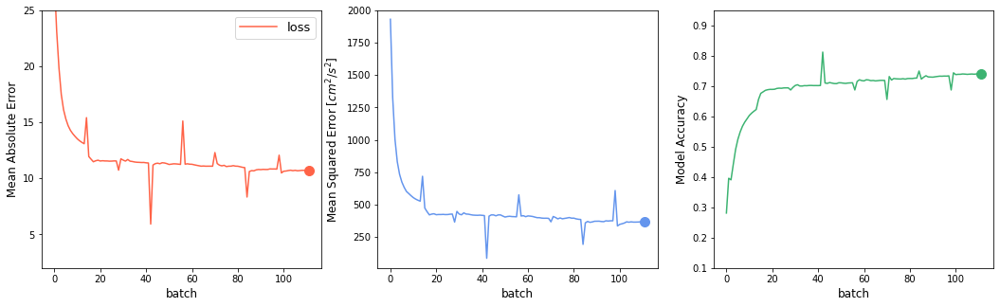

1340/1340 [==============================] - 8s 6ms/step - loss: 10.6811 - mae: 10.6811 - mse: 364.3447 - accuracy: 0.7404
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_lr_gs/assets


In [21]:
mn = 'gs'

history_lr[mn] = LossHistory2()
model_lr[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=8,callbacks=[history_lr[mn]])

model_lr[mn].save('models/'+ labels_lr[mn])
np.savez('models/history_' + labels_lr[mn], losses = history_lr[mn].losses, mse = history_lr[mn].mse, accuracy = history_lr[mn].accuracy)


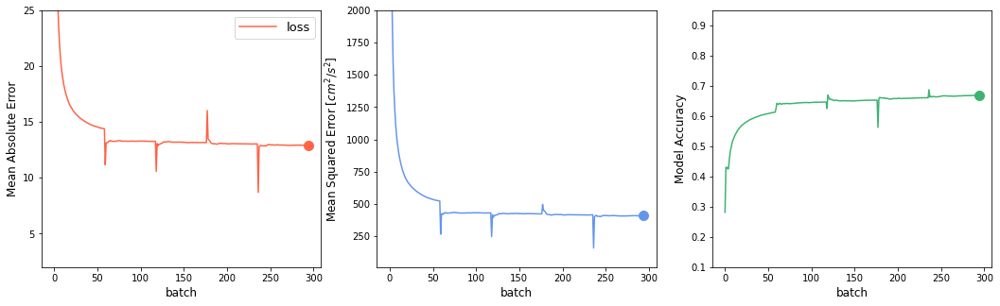

5817/5817 [==============================] - 36s 6ms/step - loss: 12.9283 - mae: 12.9283 - mse: 408.6639 - accuracy: 0.6683
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_lr_kuro/assets


In [22]:
mn = 'kuro'

history_lr[mn] = LossHistory2()
model_lr[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=5,callbacks=[history_lr[mn]])

model_lr[mn].save('models/'+ labels_lr[mn])
np.savez('models/history_' + labels_lr[mn], losses = history_lr[mn].losses, mse = history_lr[mn].mse, accuracy = history_lr[mn].accuracy)


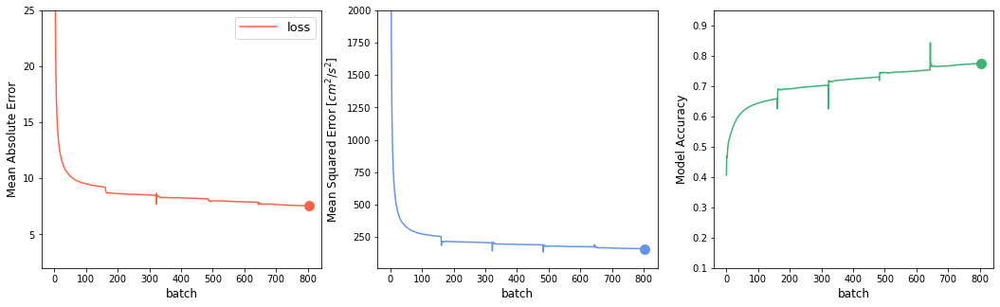

16085/16085 [==============================] - 101s 6ms/step - loss: 7.5446 - mae: 7.5446 - mse: 158.3130 - accuracy: 0.7750
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_lr_acc/assets


In [23]:
mn = 'acc'

history_lr[mn] = LossHistory2()
model_lr[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=5,callbacks=[history_lr[mn]])

model_lr[mn].save('models/'+ labels_lr[mn])
np.savez('models/history_' + labels_lr[mn], losses = history_lr[mn].losses, mse = history_lr[mn].mse, accuracy = history_lr[mn].accuracy)


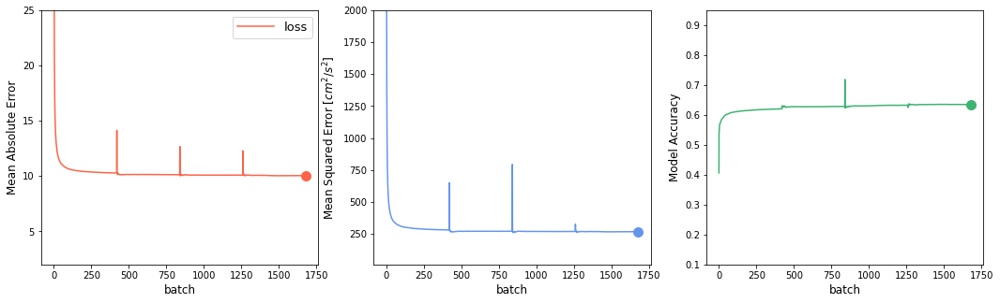

41967/41967 [==============================] - 272s 6ms/step - loss: 10.0436 - mae: 10.0436 - mse: 266.8589 - accuracy: 0.6350
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_lr_globe/assets


In [24]:
mn = 'globe'

history_lr[mn] = LossHistory2()
model_lr[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=4,callbacks=[history_lr[mn]])

model_lr[mn].save('models/'+ labels_lr[mn])
np.savez('models/history_' + labels_lr[mn], losses = history_lr[mn].losses, mse = history_lr[mn].mse, accuracy = history_lr[mn].accuracy)


In [29]:
# this will help save training history more frequently
# https://keras.io/callbacks/#create-a-callback

class LossHistory(keras.callbacks.Callback):
    def __init__(self, frequency=100):
        self.frequency = frequency
        self.batch_counter = 0
        self.losses = []
        
    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.mse = []
        self.accuracy = []
        
        self.fig = plt.figure()
        
        self.logs = []
        
    def on_batch_end(self, batch, logs={}):
        if batch % self.frequency == 0:
            self.batch_counter += self.frequency
            self.logs.append(logs)
            self.x.append(self.i)
            self.losses.append(logs.get('loss'))
            self.mse.append(logs.get('mse'))
            self.accuracy.append(logs.get('accuracy'))
        
            self.i += 1
        
            clear_output(wait=True)
            plt.figure(figsize=(18,5))
            plt.subplot(131)
            plt.plot(self.x, self.losses,color=color1,label="loss")
            plt.plot(self.x[-1], self.losses[-1],marker = 'o', markersize=10, color=color1)
            plt.legend()
            plt.xlabel(r'batch');
            plt.ylabel('Mean Absolute Error');
            plt.ylim([1,12])
            plt.subplot(132)
            plt.plot(self.x, self.mse, color=color2)
            plt.plot(self.x[-1], self.mse[-1],marker = 'o', markersize=10, color=color2)
            plt.xlabel('batch');
            plt.ylabel(r'Mean Squared Error [$cm^2/s^2$]');
            plt.ylim([5,330])

            plt.subplot(133)
            plt.plot(self.x, self.accuracy, color=color3)
            plt.plot(self.x[-1], self.accuracy[-1],marker = 'o', markersize=10, color=color3)
            plt.xlabel('batch');
            plt.ylabel('Model Accuracy');
            plt.ylim([0.1,0.99])

            plt.show();

In [30]:
history = {}

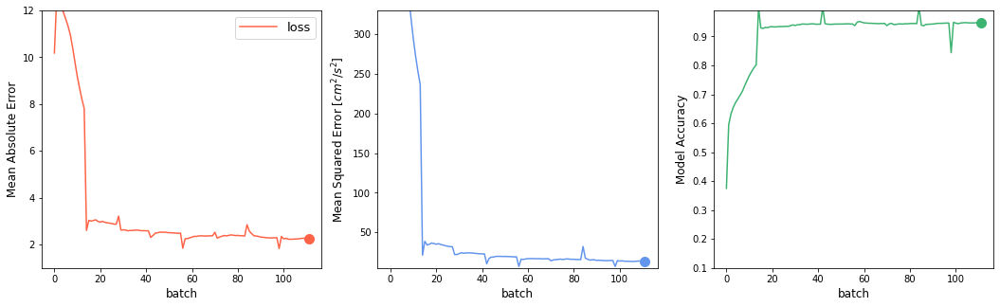

1340/1340 [==============================] - 8s 6ms/step - loss: 2.2608 - mae: 2.2608 - mse: 13.6558 - accuracy: 0.9480
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_gs/assets


In [31]:
mn = 'gs'

history[mn] = LossHistory()
model[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=8,callbacks=[history[mn]])

model[mn].save('models/'+ labels[mn])
np.savez('models/history_' + labels[mn], losses = history[mn].losses, mse = history[mn].mse, accuracy = history[mn].accuracy)


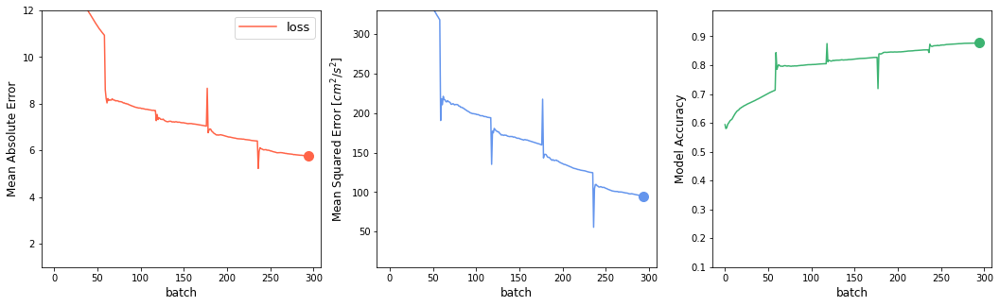

5817/5817 [==============================] - 37s 6ms/step - loss: 5.7525 - mae: 5.7525 - mse: 94.9981 - accuracy: 0.8773
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_kuro/assets


In [32]:
mn = 'kuro'

history[mn] = LossHistory()
model[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=5,callbacks=[history[mn]])

model[mn].save('models/'+ labels[mn])
np.savez('models/history_' + labels[mn], losses = history[mn].losses, mse = history[mn].mse, accuracy = history[mn].accuracy)


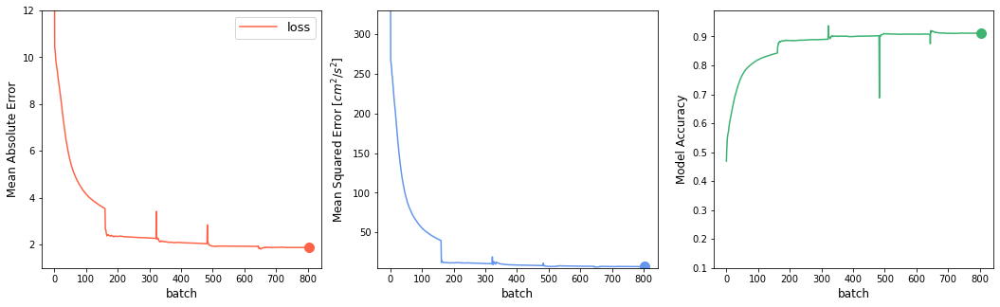

16085/16085 [==============================] - 113s 7ms/step - loss: 1.8710 - mae: 1.8710 - mse: 6.6632 - accuracy: 0.9115
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_acc/assets


In [33]:
mn = 'acc'

history[mn] = LossHistory()
model[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=5,callbacks=[history[mn]])

model[mn].save('models/'+ labels[mn])
np.savez('models/history_' + labels[mn], losses = history[mn].losses, mse = history[mn].mse, accuracy = history[mn].accuracy)


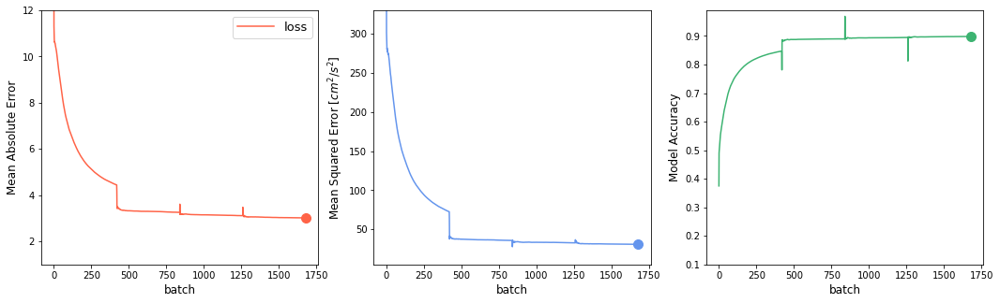

41967/41967 [==============================] - 285s 7ms/step - loss: 3.0159 - mae: 3.0159 - mse: 30.7711 - accuracy: 0.8982
INFO:tensorflow:Assets written to: models/SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_globe/assets


In [34]:
mn = 'globe'

history[mn] = LossHistory()
model[mn].fit(inputs[mn], targets[mn], batch_size=32, epochs=4,callbacks=[history[mn]])

model[mn].save('models/'+ labels[mn])
np.savez('models/history_' + labels[mn], losses = history[mn].losses, mse = history[mn].mse, accuracy = history[mn].accuracy)


In [35]:
features_test = {}
targets_test = {}

In [36]:
%%time

features_test = {}
targets_test = {}

features_test['gs'], targets_test['gs'] = prepare_data_linreg(ds_gs.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['kuro'], targets_test['kuro'] = prepare_data_linreg(ds_kuro.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['acc'], targets_test['acc'] = prepare_data_linreg(ds_acc.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)
features_test['globe'], targets_test['globe'] = prepare_data_linreg(ds.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=True, randomize=False,)


CPU times: user 9.54 s, sys: 3 s, total: 12.5 s
Wall time: 16.4 s


In [37]:
meval_n = {}

for mn in ['gs','kuro','acc']:
    meval_n[mn] = model[mn].evaluate(features_test[mn], targets_test[mn])
    meval_n[mn+'_g'] = model['globe'].evaluate(features_test[mn], targets_test[mn])


16085/16085 [==============================] - 22s 1ms/step - loss: 1.8372 - mae: 1.8372 - mse: 6.9073 - accuracy: 0.9249


In [38]:
for mn in ['globe']:
    meval_n[mn] = model[mn].evaluate(features_test[mn], targets_test[mn])


41967/41967 [==============================] - 55s 1ms/step - loss: 3.0460 - mae: 3.0460 - mse: 35.0974 - accuracy: 0.9098


In [39]:
meval_lr = {}
for mn in ['gs','kuro','acc']:
    meval_lr[mn] = model_lr[mn].evaluate(features_test[mn], targets_test[mn])
    meval_lr[mn+'_g'] = model_lr['globe'].evaluate(features_test[mn], targets_test[mn])


16085/16085 [==============================] - 20s 1ms/step - loss: 8.8116 - mae: 8.8116 - mse: 204.6002 - accuracy: 0.6461


In [40]:
for mn in ['globe']:
    meval_lr[mn] = model_lr[mn].evaluate(features_test[mn], targets_test[mn])


41967/41967 [==============================] - 53s 1ms/step - loss: 9.8079 - mae: 9.8079 - mse: 255.2632 - accuracy: 0.5980


In [41]:
%%time
features_pred = {}
targets_true = {}
targets_pred_lr = {}
targets_pred = {}

features_pred['gs'], targets_true['gs'] = prepare_data_linreg(ds_gs.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['kuro'], targets_true['kuro'] = prepare_data_linreg(ds_kuro.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['acc'], targets_true['acc'] = prepare_data_linreg(ds_acc.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)
features_pred['globe'], targets_true['globe'] = prepare_data_linreg(ds.isel(time=365*10+70), stencil_vars = ['SSH','X','Y','Z'], 
                                                          point_vars=['TAUX','TAUY',],
                                                          apply_mask=False, randomize=False,)

CPU times: user 9.48 s, sys: 2.06 s, total: 11.5 s
Wall time: 15 s


In [44]:
for mnum in ['gs','kuro','acc']:
    start = timer()
    targets_pred[mnum] = model[mnum].predict(features_pred[mnum])
    print(mnum, 'local model')
    targets_pred[mnum+'_g'] = model['globe'].predict(features_pred[mnum])
    end = timer()
    print(mnum, 'global', end - start)

gs local model
gs global 2.8320635000127368
kuro local model
kuro global 11.970647958980408
acc local model
acc global 23.66507099699811


In [45]:
for mnum in ['globe']:
    start = timer()
    targets_pred[mnum] = model[mnum].predict(features_pred[mnum])
    end = timer()
    print(mnum, 'global', end - start)

globe global 48.10722015798092


In [46]:
for mnum in ['gs','kuro','acc']:
    start = timer()
    targets_pred_lr[mnum] = model_lr[mnum].predict(features_pred[mnum])
    print(mnum, 'local model LR')
    targets_pred_lr[mnum+'_g'] = model_lr['globe'].predict(features_pred[mnum])
    end = timer()
    print(mnum, 'global LR', end - start)

gs local model LR
gs global LR 2.63037323197932
kuro local model LR
kuro global LR 13.867244181019487
acc local model LR
acc global LR 23.016186994005693


In [47]:
for mnum in ['globe']:
    start = timer()
    targets_pred_lr[mnum] = model_lr[mnum].predict(features_pred[mnum])
    end = timer()
    print(mnum, 'global LR', end - start)

globe global LR 47.6188248800172


In [69]:
model.keys()

dict_keys(['globe', 'acc', 'kuro', 'gs'])

In [266]:
colors_l = {'gs':'darkgreen', 
            'kuro':'darkred', 
            'acc':'darkgoldenrod', 
            'globe':'darkblue'}
colors_n = {'gs':'forestgreen', 
            'kuro':'red', 
            'acc':'gold', 
            'globe':'blue'}

plabels = {'gs':'Gulf Stream', 
            'kuro':'Kuroshio', 
            'acc':'ACC', 
            'globe':'Globe'}

(0.0, 20.0)

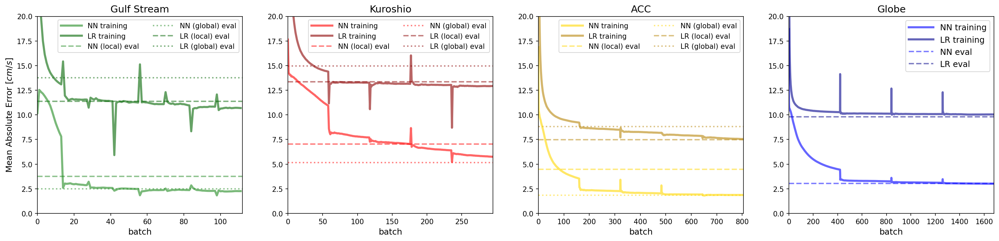

In [267]:
fig = plt.figure(figsize=(20,5), tight_layout=True, dpi=150, )
for i, r in enumerate(['gs','kuro', 'acc']):
    plt.subplot(1,4,i+1)
    plt.plot(history[r].losses, alpha=0.6, linewidth=3, label = 'NN training', color= colors_n[r])
    plt.hlines(meval_n[r][0], xmin=0, xmax=1750, linewidth = 2, label='NN (local) eval', linestyle='dashed', alpha=0.5, color= colors_n[r])
    plt.hlines(meval_n[r+'_g'][0], xmin=0, xmax=1750, linewidth = 2, label = 'NN (global) eval', linestyle='dotted', alpha=0.5, color= colors_n[r])
    
    plt.plot(history_lr[r].losses, alpha=0.6, linewidth=3, label = 'LR training', color= colors_l[r])
    plt.hlines(meval_lr[r][0], xmin=0, xmax=1750, linewidth = 2, label = 'LR (local) eval', linestyle='dashed', alpha=0.5, color= colors_l[r])
    plt.hlines(meval_lr[r+'_g'][0], xmin=0, xmax=1750, linewidth = 2, label ='LR (global) eval', linestyle='dotted', alpha=0.5, color= colors_l[r])
    
    plt.xlabel(r'batch');
    plt.title(plabels[r]);
    if r=='gs':
        plt.ylabel(r'Mean Absolute Error $[cm/s]$');
    else:
        plt.ylabel('')
    plt.xlim([0,len(history[r].losses)])
    plt.ylim([0,20])
    plt.legend(fontsize=10, ncol=2)
plt.subplot(1,4,4)
for r in ['globe']:
    plt.plot(history[r].losses, alpha=0.6, linewidth=3, label = 'NN training', color= colors_n[r])
    plt.hlines(meval_n[r][0], xmin=0, xmax=1750, linewidth = 2, label='NN eval', linestyle='dashed', alpha=0.5, color= colors_n[r])
    
    plt.plot(history_lr[r].losses, alpha=0.6, linewidth=3, label = 'LR training', color= colors_l[r])
    plt.hlines(meval_lr[r][0], xmin=0, xmax=1750, linewidth = 2, label = 'LR eval', linestyle='dashed', alpha=0.5, color= colors_l[r])
    
    plt.legend(fontsize='small')
plt.xlabel(r'batch');
plt.title(plabels[r]);
# plt.ylabel(r'Mean Absolute Error $[cm/s]$');

plt.xlim([0,len(history[r].losses)])
plt.ylim([0,20])

In [81]:
def unstack(data_flat, original_shape, stencil_size, target_index=(0, 0)):
    sub_shape = tuple(np.asarray(original_shape) // stencil_size)
    return data_flat.reshape(sub_shape)

In [74]:
unstack_shapes = {'gs': ds_gs.U.shape[1:] , 
                  'kuro': ds_kuro.U.shape[1:],
                  'acc': ds_acc.U.shape[1:], 
                  'globe': ds.U.shape[1:],}

In [106]:
%%time


U_true = {}
V_true = {}
U_pred = {}
V_pred = {}
U_err = {}
V_err = {}
u_true_flat = {}
v_true_flat = {}
u_pred_flat = {}
v_pred_flat = {}
rmserror = {}
sq_error = {}

for mnum in model.keys():
    
    U_true[mnum] = unstack(targets_true[mnum][:, 0], unstack_shapes[mnum], 2)
    V_true[mnum] = unstack(targets_true[mnum][:, 1], unstack_shapes[mnum], 2)
    
    U_pred[mnum] = unstack(targets_pred[mnum][:, 0], unstack_shapes[mnum], 2)
    V_pred[mnum] = unstack(targets_pred[mnum][:, 1], unstack_shapes[mnum], 2)

    U_err[mnum] = U_true[mnum] - U_pred[mnum]
    V_err[mnum] = V_true[mnum] - V_pred[mnum]
    u_true_flat[mnum], u_pred_flat[mnum], v_true_flat[mnum], v_pred_flat[mnum] = [np.ma.masked_invalid(data).ravel() 
                                                                                  for data in (U_true[mnum], U_pred[mnum], V_true[mnum], V_pred[mnum])]
    
    U_pred[mnum+'_lr'] = unstack(targets_pred_lr[mnum][:, 0], unstack_shapes[mnum], 2)
    V_pred[mnum+'_lr'] = unstack(targets_pred_lr[mnum][:, 1], unstack_shapes[mnum], 2)

    U_err[mnum+'_lr'] = U_true[mnum] - U_pred[mnum+'_lr']
    V_err[mnum+'_lr'] = V_true[mnum] - V_pred[mnum+'_lr']
    u_pred_flat[mnum+'_lr'], v_pred_flat[mnum+'_lr'] = [np.ma.masked_invalid(data).ravel() for data in (U_pred[mnum+'_lr'], V_pred[mnum+'_lr'])]
    
    if mnum in ['gs','kuro','acc']:
        U_pred[mnum+'_g'] = unstack(targets_pred[mnum+'_g'][:, 0], unstack_shapes[mnum], 2)
        V_pred[mnum+'_g'] = unstack(targets_pred[mnum+'_g'][:, 1], unstack_shapes[mnum], 2)

        U_err[mnum+'_g'] = U_true[mnum] - U_pred[mnum+'_g']
        V_err[mnum+'_g'] = V_true[mnum] - V_pred[mnum+'_g']
        u_pred_flat[mnum+'_g'], v_pred_flat[mnum+'_g'] = [np.ma.masked_invalid(data).ravel() for data in (U_pred[mnum+'_g'], V_pred[mnum+'_g'])]

for mnum in U_err.keys():
    rmserror[mnum] = np.sqrt(np.nanmean((U_err[mnum])**2 + (V_err[mnum])**2))
    sq_error[mnum] = ((U_err[mnum])**2 + (V_err[mnum])**2)


CPU times: user 309 ms, sys: 13.1 ms, total: 322 ms
Wall time: 319 ms


In [144]:
ds_sec = {}
ds_sec['globe'] = ds
ds_sec['gs'] = ds_gs
ds_sec['kuro']=ds_kuro
ds_sec['acc'] = ds_acc

dxu = {}
dyu = {}
dxt = {}
dyt = {}

eta = {}
fflat = {}
taux = {}
tauy = {}
ugflat = {}
vgflat = {}
ueflat = {}
veflat = {}
ugeflat = {}
vgeflat = {}
U_g = {}
V_g = {}
U_ge = {}
V_ge = {}
dvdx = {}
dudy = {}
zeta = {}
Roflat = {}
Ro = {}
U0 = {}
V0 = {}

rho = 1.027
Az = 800

for r in ds_sec.keys():
    
    dxu[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'DXU', 2, (0,0)))
    dyu[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'DYU', 2, (0,0)))
    dxt[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'DXT', 2, (0,0)))
    dyt[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'DYT', 2, (0,0)))
    
    eta[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'SSH', 2, (slice(None), slice(None))))
    U0[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'U', 2, (slice(None), slice(None))))
    V0[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'V', 2, (slice(None), slice(None))))
    fflat[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'X', 2, (0,0)))*7.2921e-5
    taux[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'TAUX', 2, (0,0)))
    tauy[r] = (extract_data(ds_sec[r].isel(time=365*10+70), 'TAUY', 2, (0,0)))

    ugflat[r] = -981/fflat[r] *(eta[r][:,1,0] + eta[r][:,1,1] - eta[r][:,0,0] - eta[r][:,0,1])/(4*dyu[r])
    vgflat[r] = 981/fflat[r] *(eta[r][:,0,1] + eta[r][:,1,1] - eta[r][:,0,0] - eta[r][:,1,0])/(4*dxu[r])

    U_g[r] = unstack(ugflat[r], ds_sec[r].U.shape[1:], 2)
    V_g[r] = unstack(vgflat[r], ds_sec[r].U.shape[1:], 2)

    ueflat[r] = np.zeros_like(taux[r]);
    veflat[r] = np.zeros_like(taux[r]);

    
    ueflat[r][fflat[r]>0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[r][fflat[r]>0])))) * (taux[r][fflat[r]>0] + tauy[r][fflat[r]>0])
    ueflat[r][fflat[r]<0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[r][fflat[r]<0])))) * (taux[r][fflat[r]<0] - tauy[r][fflat[r]<0])

    ueflat[r][fflat[r]>0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[r][fflat[r]>0])))) * (-taux[r][fflat[r]>0] + tauy[r][fflat[r]>0])
    veflat[r][fflat[r]<0] = 1/ (rho * np.sqrt((2*Az*np.abs(fflat[r][fflat[r]<0])))) * (taux[r][fflat[r]<0] + tauy[r][fflat[r]<0])

    ugeflat[r] = ugflat[r] + ueflat[r]
    vgeflat[r] = vgflat[r] + veflat[r]
    
    U_ge[r] = unstack(ugeflat[r], ds_sec[r].U.shape[1:], 2)
    V_ge[r] = unstack(vgeflat[r], ds_sec[r].U.shape[1:], 2)

    
    dvdx[r] = (V0[r][:,1,1] + V0[r][:,0,1] - V0[r][:,1,0] - V0[r][:,0,0])/(4*dxt[r])
    dudy[r] = (U0[r][:,1,1] + U0[r][:,1,0] - U0[r][:,0,1] - U0[r][:,0,0])/(4*dyt[r])
    Roflat[r] = np.abs((dvdx[r] - dudy[r]))/np.abs(fflat[r])
    Ro[r] = unstack(Roflat[r], ds_sec[r].U.shape[1:], 2)

In [145]:
for r in ds_sec.keys():
    rmserror[r+'_p'] = np.sqrt(np.nanmean((U_ge[r] - U_true[r])**2 + (V_ge[r]-V_true[r])**2))
    sq_error[r+'_p'] =  (U_ge[r] - U_true[r])**2 + (V_ge[r]-V_true[r])**2


In [146]:
sq_error.keys()

dict_keys(['globe', 'globe_lr', 'acc', 'acc_lr', 'acc_g', 'kuro', 'kuro_lr', 'kuro_g', 'gs', 'gs_lr', 'gs_g', 'globe_p', 'gs_p', 'kuro_p', 'acc_p'])

In [147]:
gs_rmse_keys = ['gs_p', 'gs_lr','gs', 'gs_g']

In [264]:
# plt.figure(figsize=(24,6), dpi=120, tight_layout=True)
# for i, r in enumerate(['gs_p', 'gs_lr','gs', 'gs_g']):
#     plt.subplot(1,5,i+1)
#     plt.pcolormesh(sq_error[r], norm=LogNorm(vmin=1, vmax=2.5e4), cmap=newcmp6);plt.colorbar(orientation='horizontal',extend='max')
# plt.subplot(155)
# plt.pcolormesh(Ro['gs'], vmin=0, vmax=1, cmap=newcmp6);plt.colorbar(orientation='horizontal')

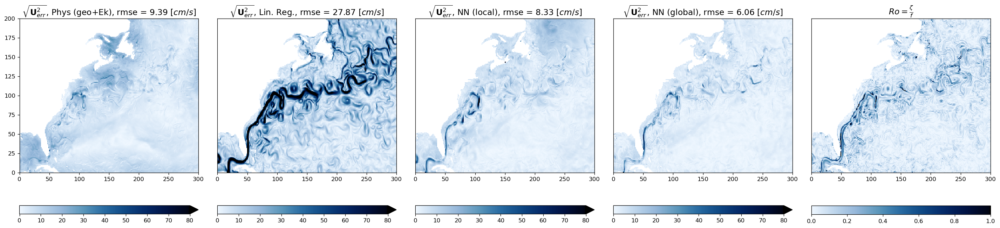

In [251]:
plt.figure(figsize=(24,6), dpi=120, tight_layout=True)
rse_labels = ['Phys (geo+Ek)', 'Lin. Reg.', 'NN (local)', 'NN (global)' ]
for i, r in enumerate(['gs_p', 'gs_lr','gs', 'gs_g']):
    plt.subplot(1,5,i+1)
    plt.pcolormesh(np.sqrt(sq_error[r]), vmin=0, vmax=80, cmap=newcmp6);plt.colorbar(orientation='horizontal',extend='max')
    plt.title(r'$\sqrt{\mathbf{U}_{err}^2}$, ' + rse_labels[i] + r', rmse = %3.2f $[cm/s]$' %(rmserror[r]))
    if i in [1,2,3]:
        plt.yticks([])
plt.subplot(155)
plt.pcolormesh(Ro['gs'], vmin=0, vmax=1, cmap=newcmp6);plt.colorbar(orientation='horizontal')
plt.title(r'$Ro = \frac{\zeta}{f}$');
plt.yticks([]);

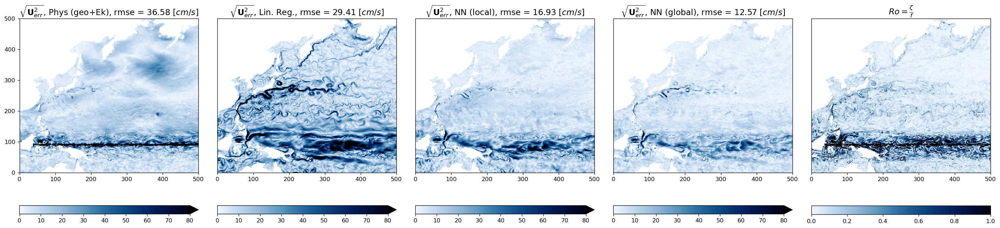

In [252]:
plt.figure(figsize=(24,6), dpi=120, tight_layout=True)
rse_labels = ['Phys (geo+Ek)', 'Lin. Reg.', 'NN (local)', 'NN (global)' ]
for i, r in enumerate(['kuro_p', 'kuro_lr','kuro', 'kuro_g']):
    plt.subplot(1,5,i+1)
    plt.pcolormesh(np.sqrt(sq_error[r]), vmin=0, vmax=80, cmap=newcmp6);plt.colorbar(orientation='horizontal',extend='max')
    plt.title(r'$\sqrt{\mathbf{U}_{err}^2}$, ' + rse_labels[i] + r', rmse = %3.2f $[cm/s]$' %(rmserror[r]))
    if i in [1,2,3]:
        plt.yticks([])
plt.subplot(155)
plt.pcolormesh(Ro['kuro'], vmin=0, vmax=1, cmap=newcmp6);plt.colorbar(orientation='horizontal')
plt.title(r'$Ro = \frac{\zeta}{f}$');
plt.yticks([]);

In [263]:
# plt.figure(figsize=(20,9), dpi=120, tight_layout=True)
# rse_labels = ['Phys (geo+Ek)', 'Lin. Reg.', 'NN (local)', 'NN (global)' ]
# for i, r in enumerate(['kuro_p', 'kuro_lr','kuro', 'kuro_g']):
#     plt.subplot(2,3,i+1)
#     plt.pcolormesh(np.sqrt(sq_error[r]), vmin=0, vmax=80, cmap=newcmp6);plt.colorbar(extend='max')
#     plt.title(r'$\sqrt{\mathbf{U}_{err}^2}$, ' + rse_labels[i] + ', rmse = %3.3f' %(rmserror[r]))
#     if i in [1,2]:
#         plt.yticks([])
# plt.subplot(2,3,5)
# plt.pcolormesh(Ro['kuro'], vmin=0, vmax=1, cmap=newcmp6);plt.colorbar()
# plt.title(r'$Ro = \frac{\zeta}{f}$');
# plt.yticks([]);

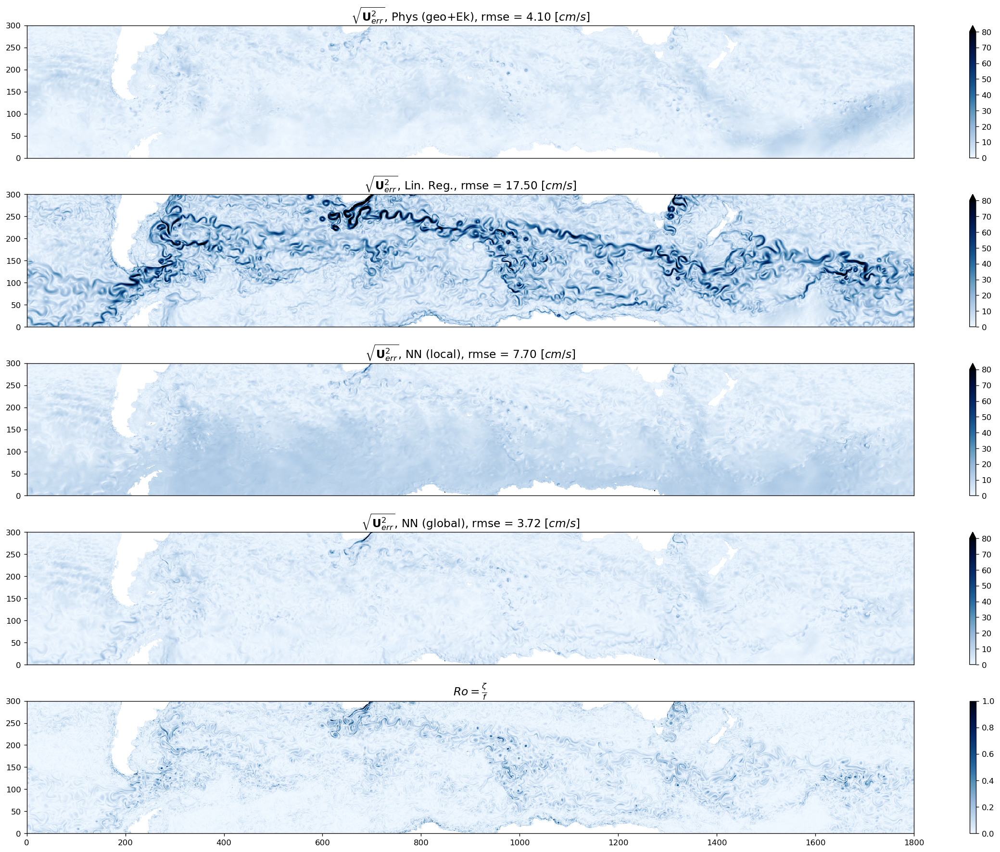

In [254]:
plt.figure(figsize=(20,15), dpi=120, tight_layout=True)
rse_labels = ['Phys (geo+Ek)', 'Lin. Reg.', 'NN (local)', 'NN (global)' ]
for i, r in enumerate(['acc_p', 'acc_lr','acc', 'acc_g']):
    plt.subplot(5,1,i+1)
    plt.pcolormesh(np.sqrt(sq_error[r]), vmin=0, vmax=80, cmap=newcmp6);plt.colorbar(extend='max')
    plt.title(r'$\sqrt{\mathbf{U}_{err}^2}$, ' + rse_labels[i] + r', rmse = %3.2f $[cm/s]$' %(rmserror[r]))
    
    plt.xticks([]);
plt.subplot(515)
plt.pcolormesh(Ro['acc'], vmin=0, vmax=1, cmap=newcmp6);plt.colorbar()
plt.title(r'$Ro = \frac{\zeta}{f}$');


In [255]:
from matplotlib.patches import Rectangle


In [261]:
# plt.figure(figsize=(16,8), dpi=150, tight_layout=True)
# plt.pcolormesh(np.sqrt(ds.isel(time=365*10+70).U.values**2 + ds.isel(time=365*10+70).V.values**2), cmap=newcmp5, vmin=0, vmax=100);
# plt.colorbar(extend='max')
# plt.title(r'$\sqrt{u^2 + v^2}$', fontsize=15)

In [ ]:
ds_kuro = ds.isel(nlon=slice(2200,3200), nlat=slice(1000,2000))
ds_gs = ds.isel(nlon=slice(200,800), nlat=slice(1400,1800))
ds_acc = ds.isel(nlat=slice(250,850))


Text(0.5, 1.0, '$\\sqrt{u^2 + v^2}$')

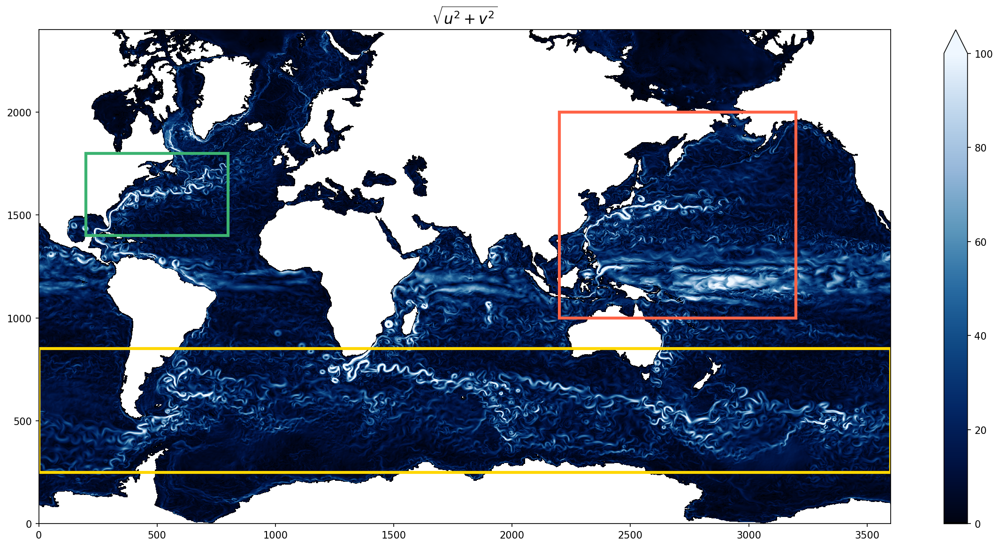

In [265]:
plt.figure(figsize=(16,8), dpi=150, tight_layout=True)
plt.pcolormesh(np.sqrt(ds.isel(time=365*10+70).U.values**2 + ds.isel(time=365*10+70).V.values**2), cmap=newcmp5, vmin=0, vmax=100);
plt.colorbar(extend='max')
ax = plt.gca()
ax.add_patch(Rectangle((2200, 1000), 1000, 1000, linewidth=3, edgecolor=color1, facecolor='none'))
ax.add_patch(Rectangle((200, 1400), 600, 400, linewidth=3, edgecolor=color3, facecolor='none'))
ax.add_patch(Rectangle((0, 250), 3600, 600, linewidth=3, edgecolor=color4, facecolor='none'))

plt.title(r'$\sqrt{u^2 + v^2}$', fontsize=15)

Text(0.5, 1.0, '$\\sqrt{u^2 + v^2}$')

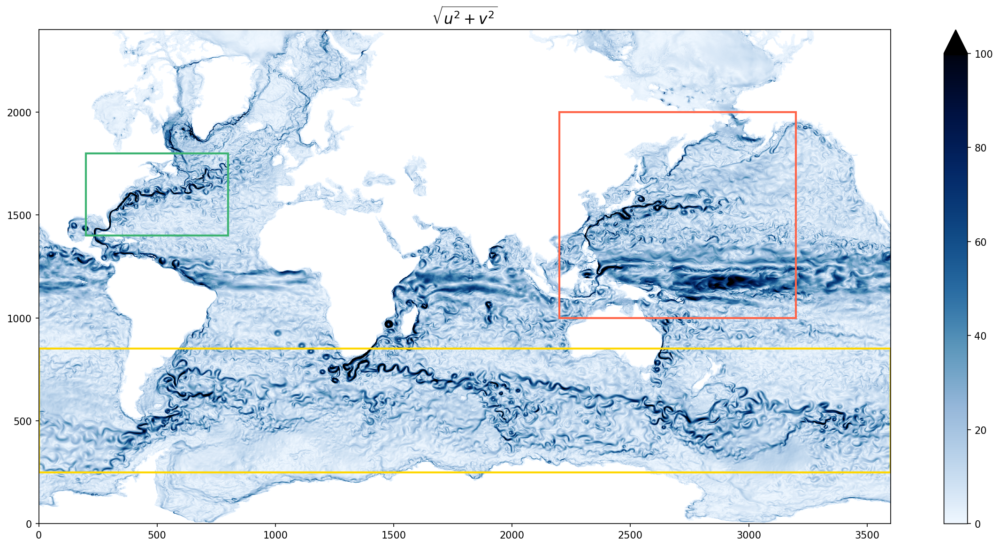

In [260]:
plt.figure(figsize=(16,8), dpi=150, tight_layout=True)
plt.pcolormesh(np.sqrt(ds.isel(time=365*10+70).U.values**2 + ds.isel(time=365*10+70).V.values**2), cmap=newcmp6, vmin=0, vmax=100);
plt.colorbar(extend='max')
ax = plt.gca()
ax.add_patch(Rectangle((2200, 1000), 1000, 1000, linewidth=2, edgecolor=color1, facecolor='none'))
ax.add_patch(Rectangle((200, 1400), 600, 400, linewidth=2, edgecolor=color3, facecolor='none'))
ax.add_patch(Rectangle((0, 250), 3600, 600, linewidth=2, edgecolor=color4, facecolor='none'))

plt.title(r'$\sqrt{u^2 + v^2}$', fontsize=15)

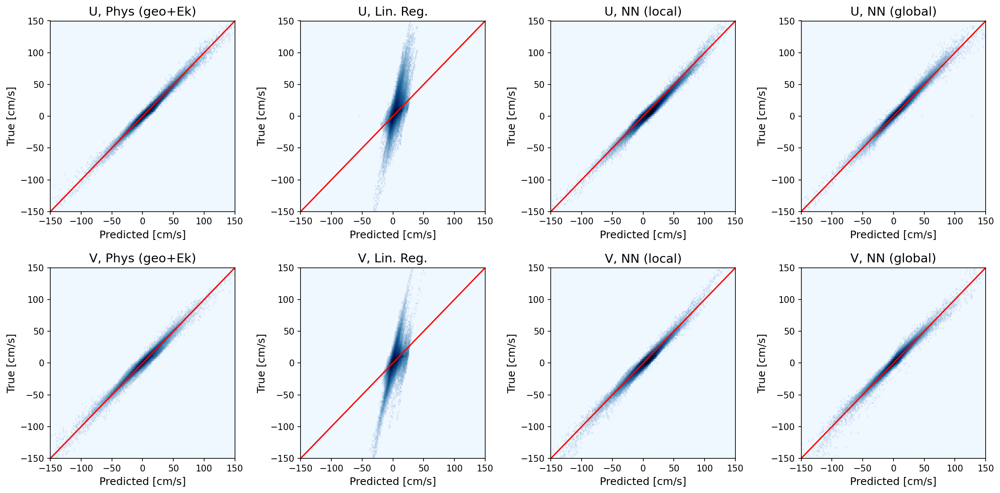

In [201]:
fig = plt.figure(figsize=(16,8), dpi=150, tight_layout=True)
lim = 150
extent = (-lim, lim, -lim, lim)
scat_labels = ['Lin. Reg.', 'NN (local)', 'NN (global)' ]
plt.subplot(2,4,1)
plt.hexbin(ugeflat['acc'], u_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('U, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot(2,4,i+2)
    plt.hexbin(u_pred_flat[r], u_true_flat['acc'], 
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('U, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('True [cm/s]')
    plt.xlabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])
plt.subplot(2,4,5)

plt.hexbin(vgeflat['acc'], v_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('V, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot(2,4,i+6)
    plt.hexbin( v_pred_flat[r], v_true_flat['acc'],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('V, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('True [cm/s]')
    plt.xlabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])





Text(0, 0.5, '$\\mathbf{U}_{err}^2/\\mathbf{U}_{true}^2$, NN (global) $[cm^2/s^2]$')

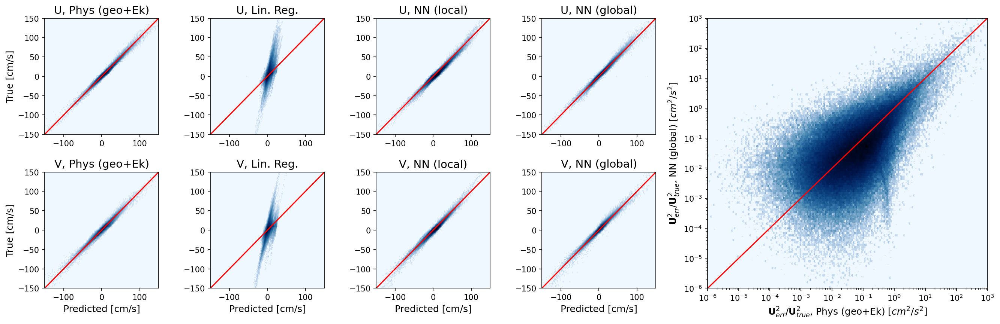

In [241]:
fig = plt.figure(figsize=(18,6), dpi=150, tight_layout=True)
lim = 150
extent = (-lim, lim, -lim, lim)
scat_labels = ['Lin. Reg.', 'NN (local)', 'NN (global)' ]
plt.subplot2grid((2,6),(0,0), rowspan=1, colspan=1)
plt.hexbin(ugeflat['acc'], u_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('U, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot2grid((2,6),(0,i+1), rowspan=1, colspan=1)
    plt.hexbin(u_pred_flat[r], u_true_flat['acc'], 
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('U, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('')
    plt.xlabel('')
    plt.xlim([-150,150])
    plt.ylim([-150,150])

plt.subplot2grid((2,6),(1,0), rowspan=1, colspan=1)
plt.hexbin(vgeflat['acc'], v_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('V, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot2grid((2,6),(1,i+1), rowspan=1, colspan=1)
    plt.hexbin( v_pred_flat[r], v_true_flat['acc'],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('V, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('')
    plt.xlabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])


plt.subplot2grid((2,6),(0,4), rowspan=2, colspan=2)

plt.hexbin(sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           extent = (-6,3,-6,3),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.plot([1e-6,1e3], [1e-6,1e3], color='r')
plt.xlim([1e-6,1e3])
plt.ylim([1e-6,1e3])
plt.xlabel(r'$\mathbf{U}_{err}^2/\mathbf{U}_{true}^2$, Phys (geo+Ek) $[cm^2/s^2]$')
plt.ylabel(r'$\mathbf{U}_{err}^2/\mathbf{U}_{true}^2$, NN (global) $[cm^2/s^2]$')



Text(0, 0.5, '$\\sqrt{\\mathbf{U}_{err}^2}/\\sqrt{\\mathbf{U}_{true}^2}$, NN (global) $[cm^2/s^2]$')

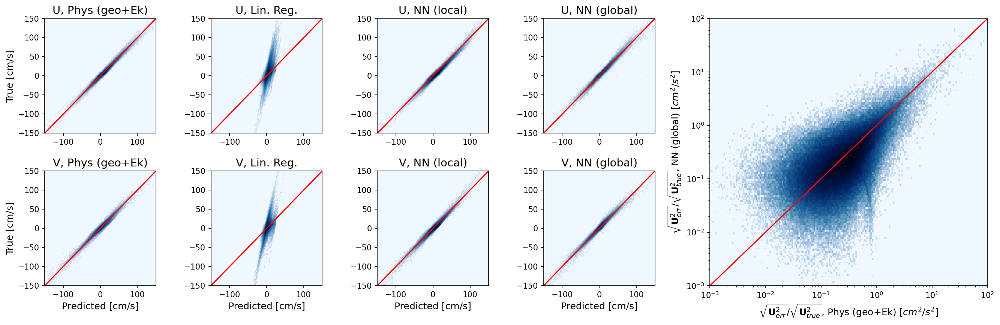

In [240]:
fig = plt.figure(figsize=(18,6), dpi=150, tight_layout=True)
lim = 150
extent = (-lim, lim, -lim, lim)
scat_labels = ['Lin. Reg.', 'NN (local)', 'NN (global)' ]
plt.subplot2grid((2,6),(0,0), rowspan=1, colspan=1)
plt.hexbin(ugeflat['acc'], u_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('U, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot2grid((2,6),(0,i+1), rowspan=1, colspan=1)
    plt.hexbin(u_pred_flat[r], u_true_flat['acc'], 
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('U, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('')
    plt.xlabel('')
    plt.xlim([-150,150])
    plt.ylim([-150,150])

plt.subplot2grid((2,6),(1,0), rowspan=1, colspan=1)
plt.hexbin(vgeflat['acc'], v_true_flat['acc'], 
              norm=LogNorm(), cmap=newcmp6,
          gridsize=200, extent=extent)
plt.title('V, Phys (geo+Ek)')
plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
plt.ylabel('True [cm/s]')
plt.xlabel('Predicted [cm/s]')
plt.xlim([-150,150])
plt.ylim([-150,150])
    
for i, r in enumerate(['acc_lr','acc','acc_g']):
    plt.subplot2grid((2,6),(1,i+1), rowspan=1, colspan=1)
    plt.hexbin( v_pred_flat[r], v_true_flat['acc'],
                  norm=LogNorm(), cmap=newcmp6,
              gridsize=200, extent=extent)
    plt.title('V, '+ scat_labels[i])
    plt.plot([-lim, lim], [-lim, lim], color='r')
#     plt.aspect('equal')
    plt.ylabel('')
    plt.xlabel('Predicted [cm/s]')
    plt.xlim([-150,150])
    plt.ylim([-150,150])


plt.subplot2grid((2,6),(0,4), rowspan=2, colspan=2)

plt.hexbin(np.sqrt(sq_error['acc_p'].ravel())/np.sqrt((u_true_flat['acc']**2 + v_true_flat['acc']**2)), 
           np.sqrt(sq_error['acc_g'].ravel())/np.sqrt((u_true_flat['acc']**2 + v_true_flat['acc']**2)), 
           extent = (-3,2,-3,2),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.plot([1e-3,1e2], [1e-3,1e2], color='r')
plt.xlim([1e-3,1e2])
plt.ylim([1e-3,1e2])
plt.xlabel(r'$\sqrt{\mathbf{U}_{err}^2}/\sqrt{\mathbf{U}_{true}^2}$, Phys (geo+Ek) $[cm^2/s^2]$')
plt.ylabel(r'$\sqrt{\mathbf{U}_{err}^2}/\sqrt{\mathbf{U}_{true}^2}$, NN (global) $[cm^2/s^2]$')



In [262]:
# plt.hexbin(np.sqrt(sq_error['acc_p'].ravel())/np.sqrt((u_true_flat['acc']**2 + v_true_flat['acc']**2)), 
#            np.sqrt(sq_error['acc_g'].ravel())/np.sqrt((u_true_flat['acc']**2 + v_true_flat['acc']**2)), 
#            extent = (-3,2,-3,2),
#            norm=LogNorm(), cmap=newcmp6,
#            gridsize=200, xscale='log',yscale='log')
# plt.plot([1e-3,1e2], [1e-3,1e2], color='r')
# plt.xlim([1e-3,1e2])
# plt.ylim([1e-3,1e2])
# plt.xlabel(r'$\mathbf{U}_{err}^2/\mathbf{U}_{true}^2$, Phys (geo+Ek) $[cm^2/s^2]$')
# plt.ylabel(r'$\mathbf{U}_{err}^2/\mathbf{U}_{true}^2$, NN (global) $[cm^2/s^2]$')



In [173]:
for r in ['acc_g', 'acc_p']:
    

dict_keys(['globe', 'globe_lr', 'acc', 'acc_lr', 'acc_g', 'kuro', 'kuro_lr', 'kuro_g', 'gs', 'gs_lr', 'gs_g', 'globe_p', 'gs_p', 'kuro_p', 'acc_p'])

In [175]:
sq_error['acc_p'].shape

(300, 1800)

In [196]:
sq_error['acc_p'].ravel().shape

(540000,)

In [198]:
Ro['acc'].ravel().shape

(540000,)

In [199]:
Roflat['acc'].shape

(540000,)

Text(0, 0.5, '$Ro = \\frac{\\zeta}{f}$')

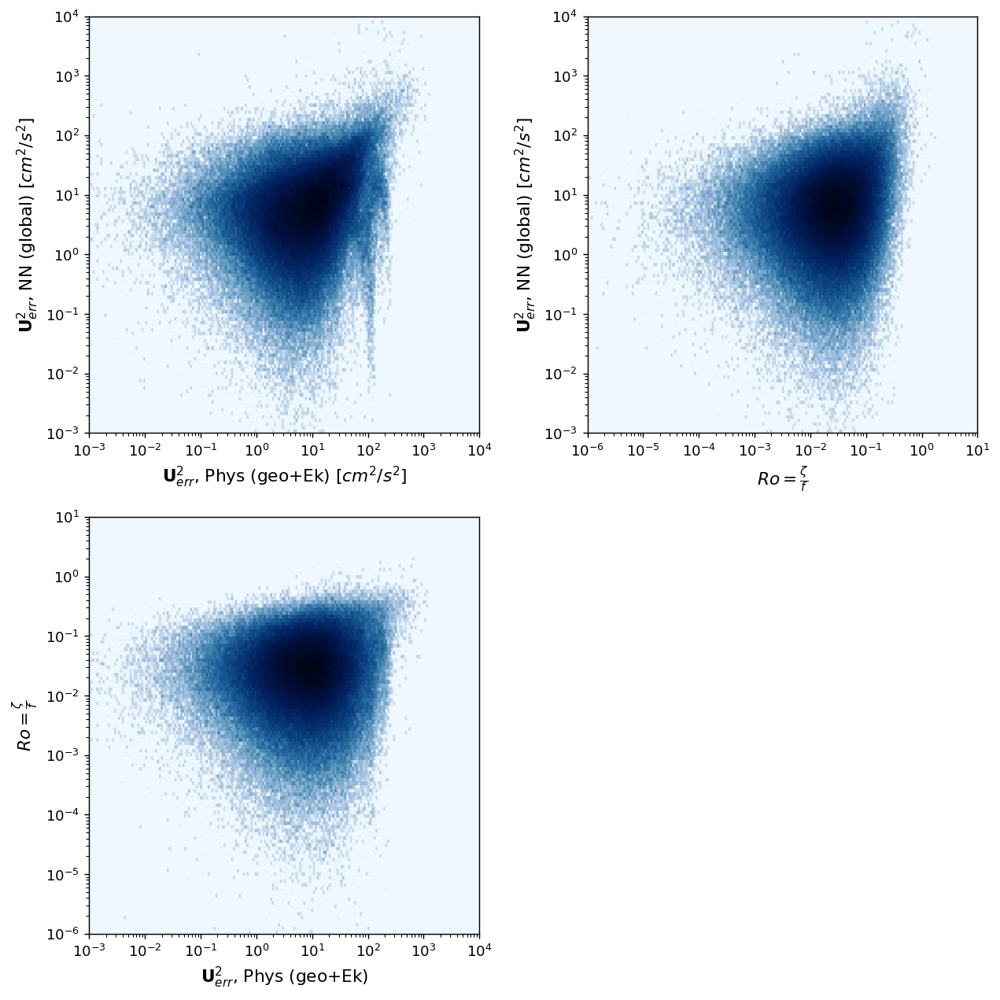

In [207]:
fig = plt.figure(figsize=(10,10), dpi=130, tight_layout=True)
plt.subplot(221)

plt.hexbin(sq_error['acc_p'].ravel(), sq_error['acc_g'].ravel(), 
           extent = (-3,4,-3,4),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-3,1e4])
plt.ylim([1e-3,1e4])
plt.xlabel(r'$\mathbf{U}_{err}^2$, Phys (geo+Ek) $[cm^2/s^2]$')
plt.ylabel(r'$\mathbf{U}_{err}^2$, NN (global) $[cm^2/s^2]$')

plt.subplot(222)

plt.hexbin(Roflat['acc'], sq_error['acc_g'].ravel(), 
           extent = (-6,1,-3,4),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.ylim([1e-3,1e4])
plt.xlim([1e-6,1e1])
plt.ylabel(r'$\mathbf{U}_{err}^2$, NN (global) $[cm^2/s^2]$')
plt.xlabel(r'$Ro = \frac{\zeta}{f}$')

plt.subplot(223)

plt.hexbin(sq_error['acc_p'].ravel(), Roflat['acc'], 
           extent = (-3,4,-6,1),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-3,1e4])
plt.ylim([1e-6,1e1])
plt.xlabel(r'$\mathbf{U}_{err}^2$, Phys (geo+Ek)')
plt.ylabel(r'$Ro = \frac{\zeta}{f}$')


Text(0, 0.5, '$Ro = \\frac{\\zeta}{f}$')

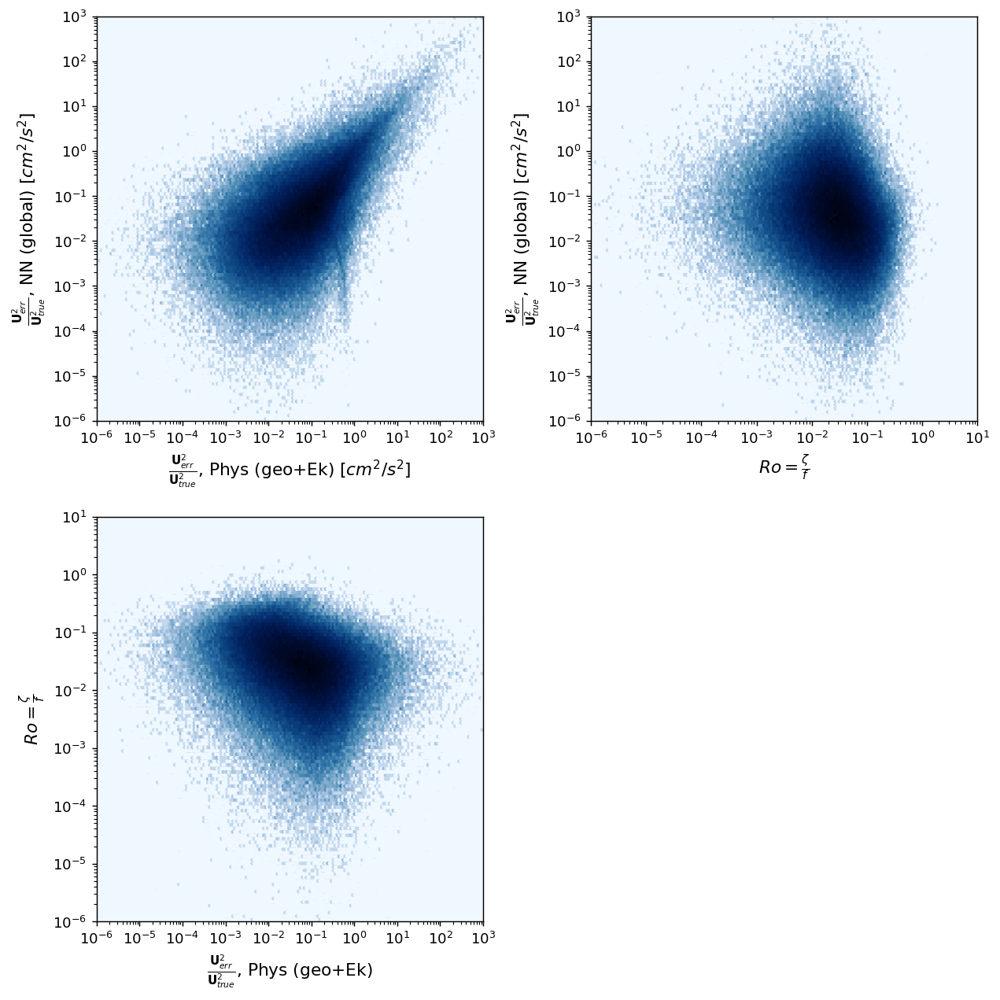

In [218]:
fig = plt.figure(figsize=(10,10), dpi=130, tight_layout=True)
plt.subplot(221)

plt.hexbin(sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           extent = (-6,3,-6,3),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-6,1e3])
plt.ylim([1e-6,1e3])
plt.xlabel(r'$\frac{\mathbf{U}_{err}^2}{\mathbf{U}_{true}^2}$, Phys (geo+Ek) $[cm^2/s^2]$')
plt.ylabel(r'$\frac{\mathbf{U}_{err}^2}{\mathbf{U}_{true}^2}$, NN (global) $[cm^2/s^2]$')

plt.subplot(222)

plt.hexbin(Roflat['acc'], 
           sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           extent = (-6,1,-6,3),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.ylim([1e-6,1e3])
plt.xlim([1e-6,1e1])
plt.ylabel(r'$\frac{\mathbf{U}_{err}^2}{\mathbf{U}_{true}^2}$, NN (global) $[cm^2/s^2]$')
plt.xlabel(r'$Ro = \frac{\zeta}{f}$')

plt.subplot(223)

plt.hexbin(sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2), 
           Roflat['acc'], 
           extent = (-6,3,-6,1),
           norm=LogNorm(), cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-6,1e3])
plt.ylim([1e-6,1e1])
plt.xlabel(r'$\frac{\mathbf{U}_{err}^2}{\mathbf{U}_{true}^2}$, Phys (geo+Ek)')
plt.ylabel(r'$Ro = \frac{\zeta}{f}$')


In [209]:
from scipy.stats import pearsonr
from scipy.stats import spearmanr


In [212]:
spearmanr(sq_error['acc_p'].ravel()[~np.isnan(sq_error['acc_p'].ravel())], sq_error['acc_g'].ravel()[~np.isnan(sq_error['acc_g'].ravel())])

SpearmanrResult(correlation=0.2892889104596892, pvalue=0.0)

In [225]:
pcorr_pn,_ = pearsonr((np.sqrt(sq_error['acc_p'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      (np.sqrt(sq_error['acc_g'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())])
scorr_pn,_ = spearmanr((np.sqrt(sq_error['acc_p'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      (np.sqrt(sq_error['acc_g'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_pn, scorr_pn)

0.7696211279273814 0.5698467785199129


In [226]:
pcorr_pr,_ = pearsonr((np.sqrt(sq_error['acc_p'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
scorr_pr,_ = spearmanr((np.sqrt(sq_error['acc_p'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_pr, scorr_pr)

-0.09513217500758789 -0.29580568746731983


In [227]:
pcorr_nr,_ = pearsonr((np.sqrt(sq_error['acc_g'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
scorr_nr,_ = spearmanr((np.sqrt(sq_error['acc_g'].ravel())/np.sqrt(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_nr, scorr_nr)

-0.0807286707032836 -0.21724110791931764


In [223]:
pcorr_pn,_ = pearsonr((sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      (sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())])
scorr_pn,_ = spearmanr((sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      (sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_pn, scorr_pn)

0.7120017087969903 0.5698467772139248


In [222]:
pcorr_pr,_ = pearsonr((sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
scorr_pr,_ = spearmanr((sq_error['acc_p'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_p'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_pr, scorr_pr)

-0.0041949693545219775 -0.29580568820013037


In [221]:
pcorr_nr,_ = pearsonr((sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
scorr_nr,_ = spearmanr((sq_error['acc_g'].ravel()/(u_true_flat['acc']**2 + v_true_flat['acc']**2))[~np.isnan(sq_error['acc_g'].ravel())], 
                      Roflat['acc'][~np.isnan(sq_error['acc_g'].ravel())])
print(pcorr_nr, scorr_nr)

-0.0044436828602499685 -0.21724110647130343


Text(0, 0.5, '$Ro = \\frac{\\zeta}{f}$')

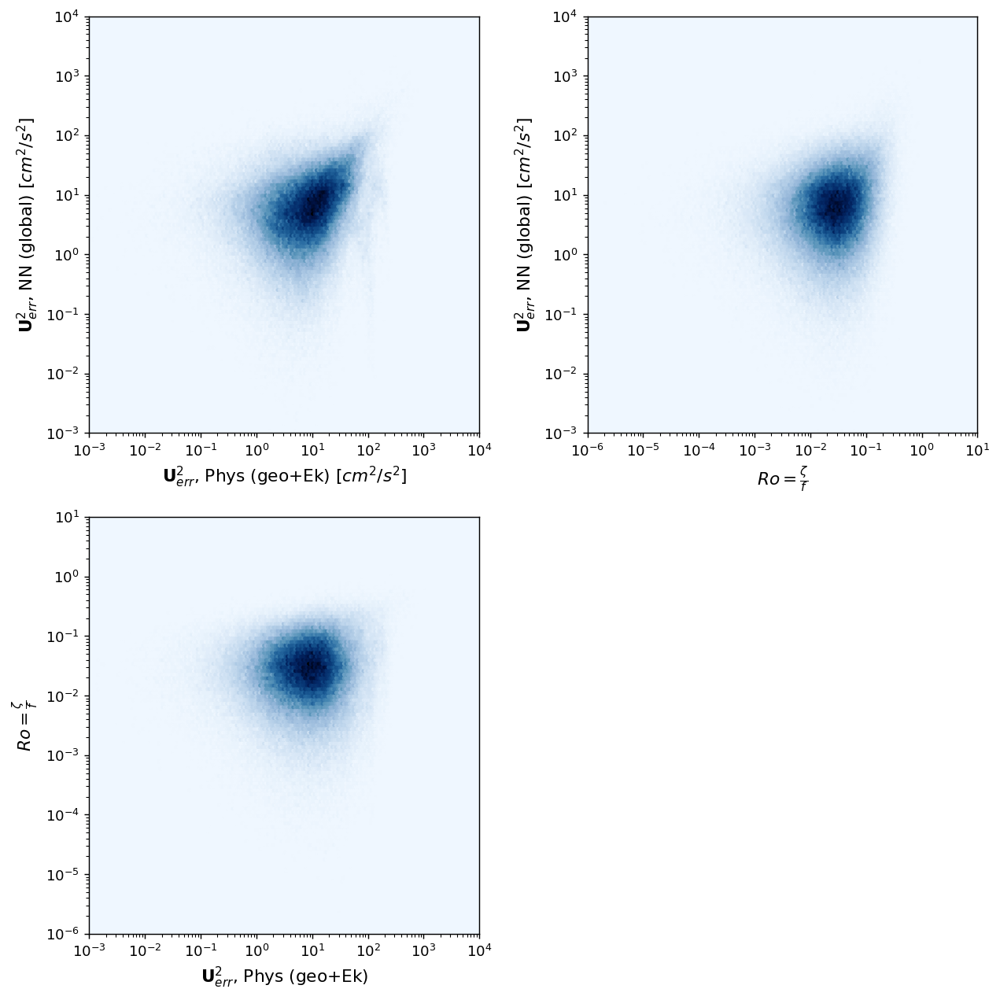

In [208]:
fig = plt.figure(figsize=(10,10), dpi=130, tight_layout=True)
plt.subplot(221)

plt.hexbin(sq_error['acc_p'].ravel(), sq_error['acc_g'].ravel(), 
           extent = (-3,4,-3,4),
           cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-3,1e4])
plt.ylim([1e-3,1e4])
plt.xlabel(r'$\mathbf{U}_{err}^2$, Phys (geo+Ek) $[cm^2/s^2]$')
plt.ylabel(r'$\mathbf{U}_{err}^2$, NN (global) $[cm^2/s^2]$')

plt.subplot(222)

plt.hexbin(Roflat['acc'], sq_error['acc_g'].ravel(), 
           extent = (-6,1,-3,4),
           cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.ylim([1e-3,1e4])
plt.xlim([1e-6,1e1])
plt.ylabel(r'$\mathbf{U}_{err}^2$, NN (global) $[cm^2/s^2]$')
plt.xlabel(r'$Ro = \frac{\zeta}{f}$')

plt.subplot(223)

plt.hexbin(sq_error['acc_p'].ravel(), Roflat['acc'], 
           extent = (-3,4,-6,1),
           cmap=newcmp6,
           gridsize=200, xscale='log',yscale='log')
plt.xlim([1e-3,1e4])
plt.ylim([1e-6,1e1])
plt.xlabel(r'$\mathbf{U}_{err}^2$, Phys (geo+Ek)')
plt.ylabel(r'$Ro = \frac{\zeta}{f}$')


In [75]:
targets_pred_lr.keys()

dict_keys(['gs', 'gs_g', 'kuro', 'kuro_g', 'acc', 'acc_g', 'globe'])

In [ ]:

    rmserror[mnum] = np.sqrt(np.nanmean((U_true[mnum] - U_pred[mnum])**2 + (V_true[mnum] - V_pred[mnum])**2))
    

In [ ]:
labels['kuro_2'] = 'SSHXYZ_2ps_pointTAUXTAUY_3l_402010_nn_kuro_2'

labels_lr['kuro_2'] = 'SSHXYZ_2ps_pointTAUXTAUY_lr_kuro_2'

inputs['kuro_2'], targets['kuro_2'] = prepare_data_linreg(ds_kuro.isel(time=10), stencil_vars = ['SSH', 'X', 'Y', 'Z'], 
                                                          point_vars=['TAUX','TAUY',])


In [ ]:
for r in ['kuro_2']:
    input_lr[r] = keras.Input(shape=inputs[r].shape[1:])

    output_lr[r] = tf.keras.layers.Dense(2)(input_lr[r])

    model_lr[r] = tf.keras.Model(inputs=input_lr[r],
                        outputs=output_lr[r])

    model_lr[r].compile(loss='mae', optimizer='Adam', metrics=['mae', 'mse','accuracy'])
    model_lr[r].summary()

In [ ]:
for r in ['kuro_2']:
    input_layer[r] = keras.Input(shape=inputs[r].shape[1:])
    hidden_layer_1[r] = tf.keras.layers.Dense(40, activation='relu')(input_layer[r])
    hidden_layer_2[r] = tf.keras.layers.Dense(20, activation='relu')(hidden_layer_1[r])
    hidden_layer_3[r] = tf.keras.layers.Dense(10, activation='relu')(hidden_layer_2[r])
    output_layer[r] = tf.keras.layers.Dense(2)(hidden_layer_3[r])

    model[r] = tf.keras.Model(inputs=input_layer[r],
                        outputs=output_layer[r])

    # optimizer = tf.train.AdamOptimizer()
    model[r].compile(loss='mae', optimizer='Adam', metrics=['mae', 'mse','accuracy'])
    model[r].summary()